In [1]:
%load_ext autoreload
%autoreload 2

In [111]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

from load_data import load_london, load_newyork, load_paris, load_gdf
from evaluation import print_comparison_results
from interpretation import (
    plot_calibration_comparison,
    plot_uncertainty_map_with_hatching,
    compute_feature_importance,
    plot_feature_importance,
    plot_regional_feature_importance,
)
from evaluation import print_comparison_results, hexaclus_pairing
import pandas as pd


In [ ]:
\
CITIES      = ['new_york', 'paris', 'london']
LOAD_FNS    = [load_newyork, load_paris, load_london]
SPLIT_RATE  = (0.7, 0.1, 0.2)
RESULTS_DIR = './results/'
PKL_FILE    = 'results.pkl'   # contains both clustering & baseline models


In [ ]:
def load_city(city_idx, if_mapping):
    city = CITIES[city_idx]
    save_path = RESULTS_DIR + city + '/'

    with open(save_path + PKL_FILE, 'rb') as f:
        results = pickle.load(f)
    if if_mapping:
        results =  mapping_result_key(results)

    df, label_scaler, label_cols = LOAD_FNS[city_idx](split_rate=SPLIT_RATE, scale=True, coords_only=False)
    df = df.reset_index(drop=True)
    (gdf_train, gdf_val,  gdf_test), (df_train, df_val, df_test) = load_gdf(df)

    print(f"City: {city.replace('_', ' ').upper()}")
    print(f"train={len(df_train)}  val={len(df_val)}  test={len(df_test)}")
    print(f"Models in results: {list(results.keys())}")
    return results, (gdf_train, gdf_val, gdf_test), (df_train, df_val, df_test), label_scaler, label_cols

def mapping_result_key(results):
    new_res = {}
    mapping_dict = {'clustering_bayesian' : 'HexaClus++ (bayesian)', 
                    'clustering_rf' : 'HexaClus++ (rf)', 
                    'clustering_gaussian' : 'HexaClus++ (gaussian)', 
                    'clustering_knn' : 'HexaClus++ (knn)'}
    for k, v in results.items():
        if 'clustering' in k :
            new_res[mapping_dict[k]] = v
        else:
            new_res[k] = v
    return new_res


In [ ]:
# per city results
results_ny, gdf_ny, df_ny, scaler_ny, cols_ny = load_city(0, if_mapping=True)

City: NEW YORK
  train=2913  val=416  test=833
  Models in results: ['bayesian', 'knn', 'gp', 'kriging', 'rf', 'HexaClus++ (bayesian)', 'HexaClus++ (knn)', 'HexaClus++ (rf)', 'HexaClus++ (gaussian)']


In [115]:
order, rename = hexaclus_pairing(results_ny)
df_ny_cmp = print_comparison_results(results_ny, label_scaler=scaler_ny, label_cols=cols_ny, order=order, rename=rename)
df_ny_cmp

,RMSE (orig.),MAE (orig.),Sharpness (orig.),Coverage (95%),CWC,ECE (orig.),ENCE,Calib. Corr,Tuning Time (s),N Configs,Time/Config (s)
Model,,,,,,,,,,,
HexaClus++ (bayesian),566.2638,274.2938,320.2633,0.9423,0.6701,45.0074,0.5438,0.9767,496.5,144,3.4
bayesian,620.2011,343.8583,343.4714,0.9328,1.0152,82.6152,0.5832,0.9227,0.1,256,0.0
HexaClus++ (knn),454.6866,245.9180,299.5396,0.9304,0.8821,12.8700,0.2571,0.9980,238.6,30,8.0
knn,453.1871,221.5799,274.2919,0.9376,0.6088,39.5318,0.3537,0.9896,0.2,10,0.0
HexaClus++ (rf),425.8555,219.6296,253.4777,0.9304,0.7138,27.1677,0.3369,0.9939,2273.7,18,126.3
rf,414.5170,202.2523,244.2491,0.9328,0.6219,36.0674,0.3735,0.9909,3.3,18,0.2
HexaClus++ (gaussian),428.2270,229.5689,276.9599,0.9232,1.1072,17.8309,0.2649,0.9953,1380.5,6,230.1
gp,443.3992,205.2865,236.8087,0.9316,0.6363,39.6281,0.3209,0.9848,626.1,3,208.7
kriging,562.2826,315.2823,246.1662,0.8283,83.6218,118.8927,0.7997,0.9734,3812.5,4,953.1


In [17]:
results_ny['HexaClus++ (gaussian)']['best_params']

{'beta': 0.5,
 'cooling_rate': None,
 'halo_buffer': 0.1,
 'initial_temp': 1.96,
 'kernel': 'gaussian',
 'min_samples_per_hexagon': 30,
 'random_seed': 0,
 'resolutions': 7,
 'scoring_method': 'beta_nll',
 'use_simulated_annealing': True,
 'kernel_params': {'length_scale': 5.0, 'noise_level': 0.1, 'optimizer': None}}

In [ ]:
results_pa, gdf_pa, df_pa, scaler_pa, cols_pa = load_city(1, if_mapping=True)

City: PARIS
  train=6542  val=934  test=1870
  Models in results: ['HexaClus++ (bayesian)', 'HexaClus++ (knn)', 'HexaClus++ (rf)', 'HexaClus++ (gaussian)', 'bayesian', 'knn', 'gp', 'kriging', 'rf']


In [117]:
order, rename = hexaclus_pairing(results_pa)
df_pa_cmp = print_comparison_results(results_pa, label_scaler=scaler_pa, label_cols=cols_pa,  order=order,)
df_pa_cmp

,RMSE (orig.),MAE (orig.),Sharpness (orig.),Coverage (95%),CWC,ECE (orig.),ENCE,Calib. Corr,Tuning Time (s),N Configs,Time/Config (s)
Model,,,,,,,,,,,
HexaClus++ (bayesian),3862.5996,2164.4980,3404.9466,0.9642,0.1670,565.7620,0.2404,0.9596,1407.8,144,9.8
bayesian,4328.0405,2431.0885,3672.5622,0.9631,0.1793,509.9798,0.2036,0.9399,0.2,256,0.0
HexaClus++ (knn),3964.9432,2182.0906,3408.6689,0.9620,0.1674,565.1126,0.2308,0.9675,675.4,30,22.5
knn,3942.6327,2209.6415,3652.7109,0.9701,0.1776,809.2057,0.2345,0.9433,0.7,10,0.1
HexaClus++ (rf),3894.4032,2160.6283,3474.6202,0.9652,0.1692,612.1329,0.1451,0.9740,8532.5,18,474.0
rf,3870.2266,2162.2530,3455.6511,0.9679,0.1671,594.9576,0.2025,0.9491,4.2,18,0.2
HexaClus++ (gaussian),3959.3289,2181.8518,3379.1947,0.9540,0.1669,511.6563,0.1787,0.9672,201.0,6,33.5
gp,3938.9707,2138.8581,3648.1713,0.9695,0.1772,820.6879,0.2949,0.9359,6117.9,3,2039.3
kriging,3892.3101,2095.1380,3324.4182,0.9626,0.1593,627.3870,0.2372,0.9304,15372.7,4,3843.2


In [ ]:
results_lo, gdf_lo, df_lo, scaler_lo, cols_lo = load_city(2, if_mapping=True)

City: LONDON
  train=7514  val=1074  test=2147
  Models in results: ['HexaClus++ (bayesian)', 'HexaClus++ (knn)', 'HexaClus++ (rf)', 'HexaClus++ (gaussian)', 'bayesian', 'knn', 'gp', 'kriging', 'rf']


In [ ]:
order, rename = hexaclus_pairing(results_lo)
df_lo_cmp = print_comparison_results(results_lo, label_scaler=scaler_lo, label_cols=cols_lo, order=order)
df_lo_cmp

,RMSE (orig.),MAE (orig.),Sharpness (orig.),Coverage (95%),CWC,ECE (orig.),ENCE,Calib. Corr,Tuning Time (s),N Configs,Time/Config (s)
Model,,,,,,,,,,,
HexaClus++ (bayesian),1949.1184,1391.9220,1722.0919,0.9415,0.8911,98.5766,0.0746,0.9677,2748.9,144,19.1
bayesian,2348.9119,1676.3597,2245.7253,0.9558,0.4710,191.8356,0.1153,0.9604,0.7,256,0.0
HexaClus++ (knn),1904.0021,1378.7864,1736.8197,0.9504,0.3563,76.4381,0.0738,0.9845,561.0,30,18.7
knn,2173.4371,1542.4214,2054.8412,0.9530,0.4265,165.3597,0.1181,0.9926,1.9,10,0.2
HexaClus++ (rf),1821.3075,1313.5924,1657.4732,0.9453,0.7683,105.6694,0.0997,0.9700,8872.5,18,492.9
rf,1787.6105,1245.4945,1685.9205,0.9548,0.3439,160.2525,0.1034,0.9834,3.5,18,0.2
HexaClus++ (gaussian),1921.9077,1387.7913,1805.3329,0.9420,0.9291,146.8230,0.1246,0.9759,121.4,6,20.2
gp,2091.3063,1463.4094,2245.3322,0.9688,0.4727,328.1600,0.1370,0.9740,7540.1,3,2513.4
kriging,1821.0352,1321.0880,1596.1571,0.9450,0.7407,81.7614,0.0931,0.9770,27078.9,4,6769.7


## Uncertainty Map Visualisation
Prediction map with hatching overlay for high-uncertainty zones.

In [ ]:
# change cities / kernels
results_map = [results_ny, results_pa, results_lo]
CITY_IDX   = 0 # 0=New York, 1=Paris, 2=London
MODEL_KEY  = 'HexaClus++ (rf)'
_results_map = results_map[CITY_IDX]
_city_label  = CITIES[CITY_IDX].replace('_', ' ').upper()
_scaler      = [scaler_ny, scaler_pa, scaler_lo][CITY_IDX]
_cols        = [cols_ny, cols_pa, cols_lo][CITY_IDX]

c:\Users\Yameng\Documents\Research\HexaClusV2\hexaclus_v3\interpretation.py:236: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='upper right', fontsize=10 + 5, framealpha=0.5)
c:\Users\Yameng\Documents\Research\HexaClusV2\hexaclus_v3\interpretation.py:236: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', fontsize=10 + 5, framealpha=0.5)


Saved hatched uncertainty map to ./results/new_york/HexaClus++ (rf)_uncertainty_map.png


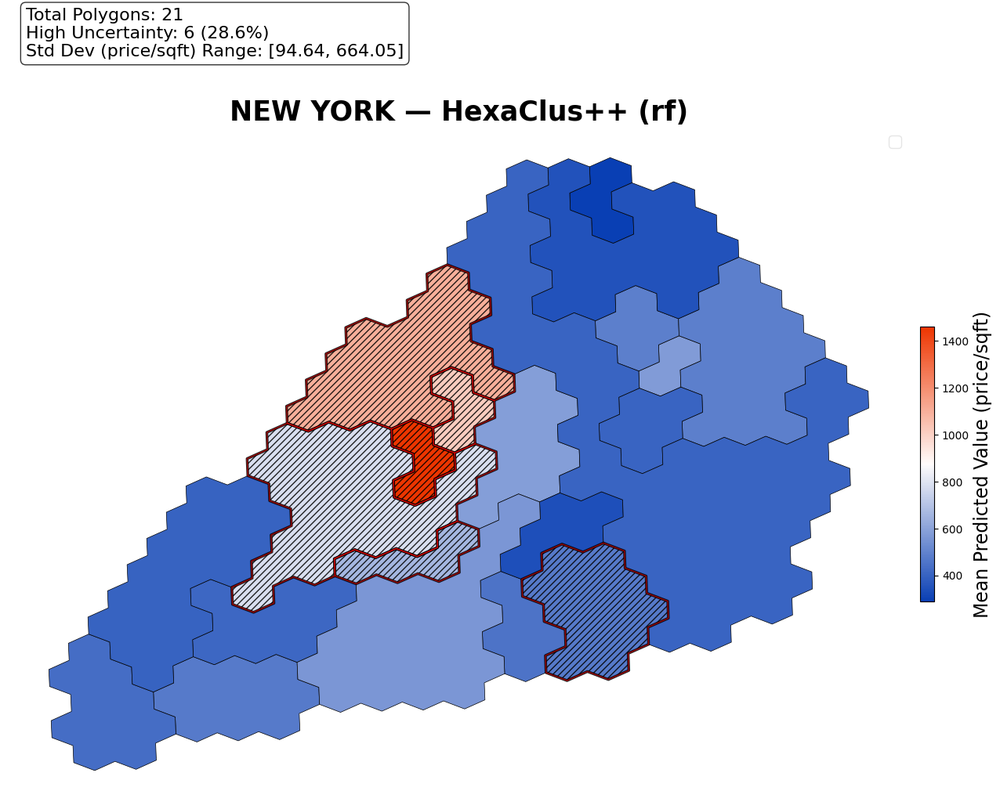

In [ ]:
m = _results_map[MODEL_KEY]
plot_uncertainty_map_with_hatching(
    clustering_model = m['model'],
    test_instances = m['test_instance'],
    y_pred = np.array(m['test_pred']),
    std_pred = m['test_std'],
    uncertainty_threshold = 0.75,
    figsize = (14, 10),
    title = f"{_city_label} — {MODEL_KEY}",
    save_path = RESULTS_DIR + CITIES[CITY_IDX] + f'/{MODEL_KEY}_uncertainty_map.png',
    label_scaler = _scaler,
    label_cols = _cols,
    unit = 'sqft'
)
plt.show()

## Feature Importance
Permutation importance computed in **original price/sqm scale** 

In [ ]:
_results_fi = results_map[CITY_IDX]
_city_label = CITIES[CITY_IDX].replace('_', ' ').upper()
_scaler_fi  = [scaler_ny, scaler_pa, scaler_lo][CITY_IDX]
_cols_fi    = [cols_ny, cols_pa, cols_lo][CITY_IDX]

feature_groups = {
    'spatial' : ['offset_x', 'offset_y', 'offset_distance', 'offset_angle', 'x', 'y'],
    'hex2vec' : list(range(5)),
}
hedonic_feats = [
    c for c in _results_fi[MODEL_KEY]['test_instance'].columns
    if c not in feature_groups['spatial']
    and c not in feature_groups['hex2vec']
    and c != 'label'
    and c != 'geometry'
]
feature_groups['hedonic'] = hedonic_feats
print('Hedonic features:', hedonic_feats)

Hedonic features: ['BEDS', 'BATH', 'PROPERTYSQFT', 'TYPE']


In [ ]:
individual_df, grouped_df = compute_feature_importance(
    clustering_model = _results_fi[MODEL_KEY]['model'],
    test_instances = _results_fi[MODEL_KEY]['test_instance'],
    feature_groups = feature_groups,
    n_repeats = 30,
    label_scaler = _scaler_fi,
    label_cols = _cols_fi,
    unit = 'sqft'
)

Saved feature importance plot to ./results/new_york/global_feature_importance.png


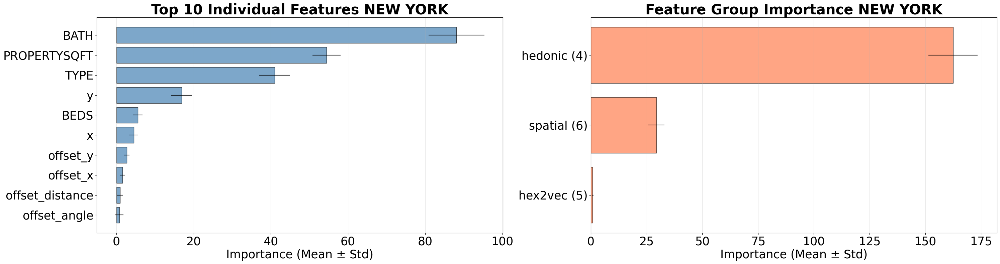

In [ ]:
plot_feature_importance(
    individual_df,
    grouped_df,
    top_n = 10,
    figsize = (30, 8),
    title = f' {_city_label}',
    save_path = RESULTS_DIR + CITIES[CITY_IDX] + '/global_feature_importance.png',
)
plt.show()

Computing regional feature importance...


c:\Users\Yameng\Documents\Research\HexaClusV2\.venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\Yameng\Documents\Research\HexaClusV2\.venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\Yameng\Documents\Research\HexaClusV2\.venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\Yameng\Doc

Saved regional feature importance map to ./results/new_york/regional_feature_importance.png


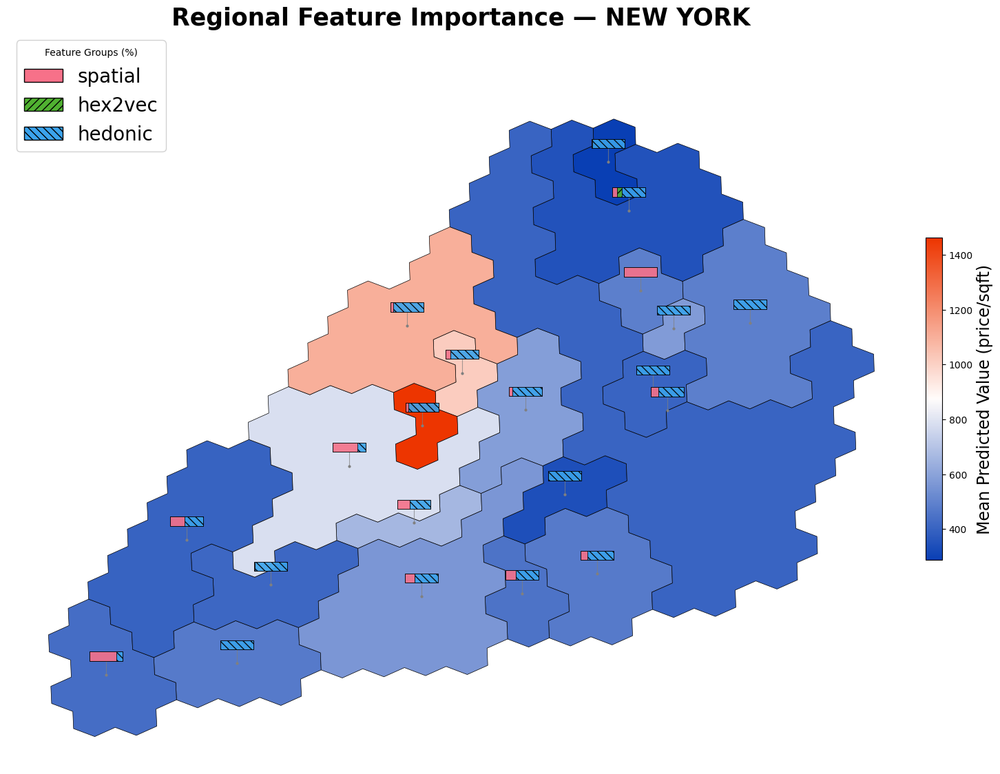

In [ ]:

fig, ax = plot_regional_feature_importance(
    _results_fi[MODEL_KEY]['model'],
    test_instances = _results_fi[MODEL_KEY]['test_instance'],
    feature_groups = feature_groups,
    y_pred = np.array(_results_fi[MODEL_KEY]['test_pred']),
    title = f'Regional Feature Importance — {_city_label}',
    save_path = RESULTS_DIR + CITIES[CITY_IDX] + '/regional_feature_importance.png',
    label_scaler = _scaler_fi,
    label_cols = _cols_fi,
    unit = 'sqft'
)
plt.show()